<h1>Optimal Hard Threshold truncation technique usage on PCA</h1>

References:
* https://youtu.be/epoHE2rex0g
* http://databookuw.com/databook.pdf, chapter 1.7

I'm gonna assume you're familiar with the concepts of Singular Value Decomposition (SVD) and Principal Component Analysis (PCA) for the sake of simplicity.

We start by creating a 600x600 image, defining it's SVD decomposition.

In [1]:
import numpy as np

t = np.arange(-3, 3, 0.01)

Utrue = np.array([np.cos(17*t) * np.exp(-t**2), np.sin(11*t)]).T
Strue = np.array([[2, 0], [0, 0.5]])
Vtrue = np.array([np.sin(5*t) * np.exp(-t**2), np.cos(13*t)]).T

print(f'U shape: {Utrue.shape}')
print(f'Sigma shape: {Strue.shape}')
print(f'V shape: {Vtrue.shape}')

U shape: (600, 2)
Sigma shape: (2, 2)
V shape: (600, 2)


Showing the image.

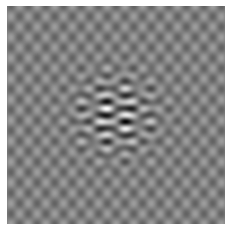

In [2]:
import matplotlib.pyplot as plt

X = Utrue @ Strue @ Vtrue.T

plt.imshow(X)
plt.set_cmap('gray')
plt.axis('off')
plt.show()

The OHT might be interesting to use when we can assume that the dataset is contaminated with Gaussian white noise. Considering that, we are going to introduce it artificially into the image.

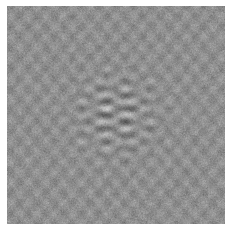

In [3]:
noise_magnitude = 1
Xnoisy = X + noise_magnitude * np.random.randn(*X.shape)

plt.imshow(Xnoisy)
plt.set_cmap('gray')
plt.axis('off')
plt.show()

When the noise magnitude is known, there's a closed form solution for the optimal threshold, otherwise an approximation is needed. Since we added the noise artificially, we know the magnitude value and can use the closed form.

In [4]:
N = Xnoisy.shape[0]
tau = (4/np.sqrt(3)) * np.sqrt(N) * noise_magnitude

print(f'Optimal Hard Threshold: {tau:.2f}')

Optimal Hard Threshold: 56.57


The above value is used to determine how many dimensions are going to be kept in the dataset. That is done by taking the diagonal values of the sigma matrix in the SVD decomposition, which are ordered from largest to smallest, and discarding the ones that are smaller than the calculated "tau" value.

In [5]:
U, S, VT = np.linalg.svd(Xnoisy)

cut_oht = np.max(np.where(S > tau)) + 1
Xclean_oht = U[:,:(cut_oht)] @ np.diag(S[:(cut_oht)]) @ VT[:(cut_oht),:]
print(f'Dimensions kept: {cut_oht}')

Dimensions kept: 2


We are also going to use a 90% variance cut in the PCA as an example, since it's an usual value used for dimensional reduction of datasets.

In [6]:
from sklearn.decomposition import PCA as SKLPCA

pca = SKLPCA()
pca.fit_transform(Xnoisy)
cumsum = np.cumsum(pca.explained_variance_ratio_)
cut_90 = np.argmax(cumsum >= .9) + 1
print(f'Dimensions kept: {cut_90}')

Xclean_90 = U[:,:(cut_90)] @ np.diag(S[:(cut_90)]) @ VT[:(cut_90),:]

Dimensions kept: 296


Showing the images, side by side.

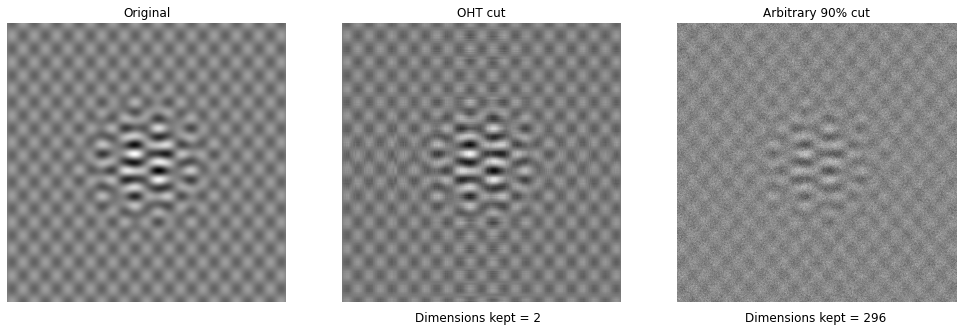

In [7]:
fig, axes = plt.subplots(nrows=1, ncols=3)
fig.set_size_inches(17, 25)

axes[0].imshow(X)
axes[0].set_title('Original')
axes[0].axis('off')

axes[1].imshow(Xclean_oht)
axes[1].set_title('OHT cut', fontsize=12)
plt.figtext(.458, .414, f'Dimensions kept = {cut_oht}', fontsize=12)
axes[1].axis('off')

axes[2].imshow(Xclean_90)
axes[2].set_title('Arbitrary 90% cut', fontsize=12)
plt.figtext(.728, .414, f'Dimensions kept = {cut_90}', fontsize=12)
axes[2].axis('off')

plt.show()

We can see that the 90% cut was not enough to remove all the noise from the image, and that the difference from the original noisy one was barely noticeable to the human eye. The OHT, otherwise, had a much better result. The method was not capable of fully restoring the image to its original form, but the result closely resembles it.

Now we are going to use an auxiliary class that will make the dimension reduction quicker, applying it to one of our datasets to demonstrate its usage.

In [8]:
import pandas as pd

df = pd.read_csv('FRA3-FRA6_cleaned_feature_engineered.csv')
pd.set_option('display.max_columns', None)
df[:6]

,Trail_right_z_sec_susp,Lead_left_z_sec_susp,Trail_left_z_sec_susp,Lead_right_z_sec_susp,Triaxial_x,Triaxial_z,Lead_z_accel_right_side,Susp_travel_left,Susp_travel_right,Pitch_accel,Front_Bounce_accel,Front_Roll_susp,Back_Roll_susp,Roll_susp,Lead_z_vel_right_side,Lead_z_pos_right_side,Trail_right_z_sec_susp_mean_55 samples,Lead_left_z_sec_susp_skew_55 samples,Trail_left_z_sec_susp_std_55 samples,Lead_right_z_sec_susp_std_55 samples,Triaxial_x_mean_55 samples,Triaxial_x_RMA_55 samples,Triaxial_x_MA_55 samples,Triaxial_x_RMS_55 samples,Triaxial_z_mean_55 samples,Susp_travel_mean_55 samples,Susp_travel_skew_55 samples,Pitch_left_susp_mean_55 samples,Bounce_susp_mean_55 samples,Front_Roll_susp_skew_55 samples,Vert_irreg_right_rail
0,-0.0341,0.0309,0.0218,-0.0218,-0.000116,-0.000749,-0.001817,0.0309,-0.0341,-0.000459,-0.002312,0.0527,0.0559,0.0559,-0.000196,-0.000021,-0.009133,0.748715,0.006513,0.006426,-0.000005,0.008054,0.000065,0.000457,-0.000293,0.004538,-1.143003,0.000911,0.001606,0.941525,-0.0712
1,-0.0356,0.0316,0.0228,-0.0228,-0.000139,-0.000749,-0.001812,0.0316,-0.0356,-0.000542,-0.002563,0.0544,0.0584,0.0584,-0.000185,-0.000017,-0.009788,0.697568,0.006880,0.006815,-0.000007,0.008238,0.000068,0.000457,-0.000307,0.003883,-1.156428,0.000941,0.001485,0.893110,-0.0753
2,-0.0367,0.0320,0.0237,-0.0239,-0.000162,-0.000727,-0.001605,0.0320,-0.0367,-0.000613,-0.002683,0.0559,0.0604,0.0604,-0.000136,-0.000011,-0.010463,0.644357,0.007243,0.007208,-0.000010,0.008436,0.000071,0.000458,-0.000320,0.003208,-1.139831,0.000970,0.001362,0.843661,-0.0791
3,-0.0370,0.0314,0.0244,-0.0248,-0.000182,-0.000650,-0.000912,0.0314,-0.0370,-0.000654,-0.002485,0.0562,0.0614,0.0614,-0.000061,-0.000003,-0.011145,0.583335,0.007595,0.007594,-0.000014,0.008647,0.000075,0.000459,-0.000332,0.002527,-1.100159,0.000993,0.001242,0.787577,-0.0827
4,-0.0373,0.0309,0.0251,-0.0257,-0.000202,-0.000574,-0.000219,0.0309,-0.0373,-0.000695,-0.002289,0.0566,0.0624,0.0624,0.000014,0.000006,-0.011832,0.518601,0.007935,0.007975,-0.000017,0.008870,0.000079,0.000459,-0.000342,0.001840,-1.048016,0.001013,0.001125,0.728316,-0.0858
5,-0.0376,0.0304,0.0258,-0.0266,-0.000223,-0.000496,0.000475,0.0304,-0.0376,-0.000737,-0.002091,0.0570,0.0634,0.0634,0.000089,0.000014,-0.012525,0.451999,0.008264,0.008349,-0.000022,0.009105,0.000083,0.000460,-0.000352,0.001146,-0.989171,0.001028,0.001012,0.667493,-0.0885


Separating the labels for later usage.

In [9]:
y = df['Vert_irreg_right_rail'].values
print(y[:6])
print(f'Columns count: {len(df.columns)}')

[-0.0712 -0.0753 -0.0791 -0.0827 -0.0858 -0.0885]
Columns count: 31


Since the dataset has already gone through treatments and the PCA auxiliary class applies normalization to the input, we don't need to do any additional operations to the data.

The auxiliary PCA class we have built automates the method's construction processes and has included graph plotting functions for easier visualizations.

In [10]:
from dim_reduction import PCA

df_values = df.drop('Vert_irreg_right_rail', axis=1).values
optht_pca = PCA(df_values, strategy='oht')

Next, we have the cumulative energy of each singular value of the PCA.

In [11]:
optht_pca.plot_cumulative_energy()

And here is the actual singular values.

In [12]:
optht_pca.plot_singular_values(log=False)

In the following cell we have the plot of the dataset reduced to two dimensions.

In [13]:
optht_pca.plot_2d()

And here for three dimensions.

In [14]:
optht_pca.plot_3d()

In the following cells we are going to train some regression models to analyze how well the dimensional reductions can still represent the dataset information.

First we need to define the datasets.

In [15]:
from sklearn.preprocessing import StandardScaler
from sklearn.utils import shuffle


optht_cut = optht_pca.get_sv_index_cut()
arbitrary_cut = 18 # observed in the graph

original_dataset = shuffle(df.values)

print(f'Datset shape: {original_dataset.shape}')

X = original_dataset[:, :-1]
X_full = StandardScaler().fit_transform(X)
y = original_dataset[:, -1].flatten()

X_arbitrary = PCA(X, strategy='arbitrary cut', n_components=arbitrary_cut).get_cut_dataset()
X_oht = optht_pca.get_cut_dataset()

print(f'y shape: {y.shape}')
print(f'X_full shape: {X_full.shape}')
print(f'X_arbitrary shape: {X_arbitrary.shape}')
print(f'X_oht shape: {X_oht.shape}')

Datset shape: (68101, 31)
y shape: (68101,)
X_full shape: (68101, 30)
X_arbitrary shape: (68101, 18)
X_oht shape: (68101, 11)


We chose three regression models to test the datasets: Lasso, Random Forests and XGBoost.
 
The first of those is a linear model and is expected to be the worst one. That's because the data we are working with presents a non-linear behaviour. The second and third are both non-linear and are thus expected to have better results.

In [16]:
from time import time

from xgboost import XGBRegressor
from sklearn.linear_model import Lasso
from sklearn.ensemble import RandomForestRegressor
from sklearn.model_selection import cross_val_score
from sklearn.model_selection import RepeatedKFold


n_jobs = 6 # represents the amount of CPU cores to used for the following models

models = [
	('Lasso', Lasso(alpha=.05)), 
	('Random Forests', RandomForestRegressor(n_jobs=n_jobs)),
	('XGBoost', XGBRegressor(n_jobs=6))
]
cv = RepeatedKFold(n_splits=10, n_repeats=1, random_state=42)

results = []
datasets = [X_full, X_arbitrary, X_oht]
for dataset in datasets:
	dimensions = dataset.shape[1]
	print(f'DIMENSIONS: {dimensions}')

	for name, model in models:
		exec_time = time()
		score = np.mean(cross_val_score(model, dataset, y, scoring='r2', cv=cv, n_jobs=-1))
		exec_time = time() - exec_time
		results.append({
			'dimensions': dimensions,
			'model': name,
			'r2': score,
			'exec time': exec_time
		})
		print(f'{name}\n\tR²: {score:.4f}\n\texec time: {exec_time:.2f} secs')

	print('----------------------------------------------------------')


DIMENSIONS: 30
Lasso
	R²: 0.5877
	exec time: 14.40 secs


In the following cell it's created a pandas dataframe and added two new columns. Those represent the relative values of the model's r² score and execution time to the hole-dimensional dataset.

In [ ]:
results_df = pd.DataFrame(results)
results_df['r2 relative perc'] = np.nan
results_df['exec time relative perc'] = np.nan
results_df['dim model'] = np.nan

def relative_values(row):
    aux = results_df.loc[(results_df['dimensions'] == 30) & (results_df['model'] == row['model'])]
    return (
        (row['r2'] - aux['r2']) * 100 / aux['r2'], 
        (row['exec time'] - aux['exec time']) * 100 / aux['exec time']
    )

for i in range(results_df.shape[0]):
    r2_relative, exec_time_relative = relative_values(results_df.iloc[i])
    results_df.at[i, 'r2 relative perc'] = r2_relative
    results_df.at[i, 'exec time relative perc'] = exec_time_relative
    results_df.at[i, 'model dim'] = results_df.loc[i, 'model'] + ' - dim: ' + str(results_df.loc[i, 'dimensions'])

print(results_df)

Plotting the results.

In [ ]:
import plotly.express as px

fig = px.bar(
    results_df, x="model dim", y="r2", color="model",
    labels = {
        'model dim': 'Model - Dimensions',
        'r2': 'r² score',
        'model': 'Regression Model'
    },
    title='r² score for each model-dimension combination'
)
fig.show()

In conclusion, it’s needed to consider and test the different strategies of dimensional reduction for each individual dataset, considering the varying amounts of noise and information reduction of each case.
